In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import geopandas as gpd
import math

In [2]:
#Import dataset
gdp_ppp = pd.read_csv(r"C:\Users\btdjf\Desktop\Ironhack 2\Final Bootcamp Project\Final-Bootcamp-Project\Datasets\gdp_ppp.csv")
gdp_ppp

,Country,Country Code,1990,1991,1992,1993,1994,1995,1996,1997,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,ABW,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,...,33732.847450,35492.618490,35498.982090,37419.892820,38223.372260,38249.054870,38390.271650,39454.629830,NaN,NaN
1,Afghanistan,AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1637.377987,1626.764793,1806.763930,1874.765634,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,NaN
2,Angola,AGO,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,...,6230.297028,6346.395122,6772.528333,6980.423038,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,NaN
3,Albania,ALB,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,...,9628.025783,10207.752350,10526.235450,10571.010650,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,NaN
4,Arab World,ARB,6808.206995,6872.273195,7255.328362,7458.647059,7645.682856,7774.207360,8094.149842,8397.515692,...,14127.778020,14518.827450,15423.465390,15824.780110,16153.244860,16501.792590,16935.383300,17099.889390,17570.137600,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Kosovo,XKX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7782.875107,8222.285712,8547.652384,8903.763429,9194.741819,9781.019679,10208.857900,10756.663460,11348.363450,NaN
256,"Yemen, Rep.",YEM,2223.028771,2325.263661,2443.920401,2472.188808,2569.648739,2657.813447,2730.145147,2829.866193,...,4472.726448,3876.302619,3935.167105,4084.882967,4045.500031,3320.110156,2827.691023,2645.308383,2575.126385,NaN
257,South Africa,ZAF,6424.502215,6414.057923,6261.716184,6331.777580,6520.866604,6719.583315,7000.801619,7179.806651,...,11728.160490,12179.174190,12488.215570,12815.727070,13090.476830,13185.253280,13188.029620,13438.282890,13686.882360,NaN
258,Zambia,ZMB,1517.926292,1528.781247,1499.340446,1600.347799,1457.627696,1493.123972,1572.973238,1616.492883,...,3269.794329,3419.010460,3634.780353,3765.584162,3893.549478,3927.761816,3998.004435,4090.120040,4223.906936,NaN


In [3]:
# Rename columns and lower letters
cols = []
for i in range(len(gdp_ppp.columns)):
    cols.append(gdp_ppp.columns[i].lower().replace(' ', ''))
gdp_ppp.columns = cols
gdp_ppp

,country,countrycode,1990,1991,1992,1993,1994,1995,1996,1997,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,ABW,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,...,33732.847450,35492.618490,35498.982090,37419.892820,38223.372260,38249.054870,38390.271650,39454.629830,NaN,NaN
1,Afghanistan,AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1637.377987,1626.764793,1806.763930,1874.765634,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,NaN
2,Angola,AGO,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,...,6230.297028,6346.395122,6772.528333,6980.423038,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,NaN
3,Albania,ALB,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,...,9628.025783,10207.752350,10526.235450,10571.010650,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,NaN
4,Arab World,ARB,6808.206995,6872.273195,7255.328362,7458.647059,7645.682856,7774.207360,8094.149842,8397.515692,...,14127.778020,14518.827450,15423.465390,15824.780110,16153.244860,16501.792590,16935.383300,17099.889390,17570.137600,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Kosovo,XKX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7782.875107,8222.285712,8547.652384,8903.763429,9194.741819,9781.019679,10208.857900,10756.663460,11348.363450,NaN
256,"Yemen, Rep.",YEM,2223.028771,2325.263661,2443.920401,2472.188808,2569.648739,2657.813447,2730.145147,2829.866193,...,4472.726448,3876.302619,3935.167105,4084.882967,4045.500031,3320.110156,2827.691023,2645.308383,2575.126385,NaN
257,South Africa,ZAF,6424.502215,6414.057923,6261.716184,6331.777580,6520.866604,6719.583315,7000.801619,7179.806651,...,11728.160490,12179.174190,12488.215570,12815.727070,13090.476830,13185.253280,13188.029620,13438.282890,13686.882360,NaN
258,Zambia,ZMB,1517.926292,1528.781247,1499.340446,1600.347799,1457.627696,1493.123972,1572.973238,1616.492883,...,3269.794329,3419.010460,3634.780353,3765.584162,3893.549478,3927.761816,3998.004435,4090.120040,4223.906936,NaN


In [4]:
# Checking the number of rows and features
gdp_ppp.shape

(260, 32)

In [5]:
# Dropping the column 'country code'
gdp_ppp = gdp_ppp.drop(columns=['countrycode'], axis=1)
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,33732.847450,35492.618490,35498.982090,37419.892820,38223.372260,38249.054870,38390.271650,39454.629830,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1637.377987,1626.764793,1806.763930,1874.765634,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,NaN
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6230.297028,6346.395122,6772.528333,6980.423038,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,NaN
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,9628.025783,10207.752350,10526.235450,10571.010650,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,NaN
4,Arab World,6808.206995,6872.273195,7255.328362,7458.647059,7645.682856,7774.207360,8094.149842,8397.515692,8797.662606,...,14127.778020,14518.827450,15423.465390,15824.780110,16153.244860,16501.792590,16935.383300,17099.889390,17570.137600,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,Kosovo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7782.875107,8222.285712,8547.652384,8903.763429,9194.741819,9781.019679,10208.857900,10756.663460,11348.363450,NaN
256,"Yemen, Rep.",2223.028771,2325.263661,2443.920401,2472.188808,2569.648739,2657.813447,2730.145147,2829.866193,2946.082495,...,4472.726448,3876.302619,3935.167105,4084.882967,4045.500031,3320.110156,2827.691023,2645.308383,2575.126385,NaN
257,South Africa,6424.502215,6414.057923,6261.716184,6331.777580,6520.866604,6719.583315,7000.801619,7179.806651,7180.857025,...,11728.160490,12179.174190,12488.215570,12815.727070,13090.476830,13185.253280,13188.029620,13438.282890,13686.882360,NaN
258,Zambia,1517.926292,1528.781247,1499.340446,1600.347799,1457.627696,1493.123972,1572.973238,1616.492883,1584.006801,...,3269.794329,3419.010460,3634.780353,3765.584162,3893.549478,3927.761816,3998.004435,4090.120040,4223.906936,NaN


In [6]:
# Checking a summary of the df to understand the structure and content of the dataset, as nul values, and data types
gdp_ppp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260 entries, 0 to 259
Data columns (total 31 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   country  260 non-null    object 
 1   1990     209 non-null    float64
 2   1991     211 non-null    float64
 3   1992     213 non-null    float64
 4   1993     215 non-null    float64
 5   1994     218 non-null    float64
 6   1995     224 non-null    float64
 7   1996     224 non-null    float64
 8   1997     225 non-null    float64
 9   1998     226 non-null    float64
 10  1999     227 non-null    float64
 11  2000     236 non-null    float64
 12  2001     237 non-null    float64
 13  2002     238 non-null    float64
 14  2003     238 non-null    float64
 15  2004     238 non-null    float64
 16  2005     238 non-null    float64
 17  2006     238 non-null    float64
 18  2007     239 non-null    float64
 19  2008     240 non-null    float64
 20  2009     241 non-null    float64
 21  2010     241 non

In [7]:
# Display option for pandas to show all rows of the dataset
pd.set_option('display.max_rows', None)
print(gdp_ppp)

                                               country          1990  \
0                                                Aruba  24101.109430   
1                                          Afghanistan           NaN   
2                                               Angola   3089.683369   
3                                              Albania   2549.473022   
4                                           Arab World   6808.206995   
5                                 United Arab Emirates  72906.520120   
6                                            Argentina   7380.115031   
7                                              Armenia   2428.558960   
8                                  Antigua and Barbuda  11326.702620   
9                                            Australia  17329.706610   
10                                             Austria  19442.312040   
11                                          Azerbaijan   5703.869981   
12                                             Burundi    666.70

In [8]:
#Dropping rows that are not relevants
indexes_to_eliminate = [4,32,44,55,56,57,58,59,68,92,96,97,98,99,101,104,122,128,129,130,133,134,185,187,191,192,209,211,212,136,147,150,155,164,175,177,224,225,230,232,234,235,243,253]
gdp_ppp.drop(indexes_to_eliminate, inplace=True)
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,33732.847450,35492.618490,35498.982090,37419.892820,38223.372260,38249.054870,38390.271650,39454.629830,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1637.377987,1626.764793,1806.763930,1874.765634,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,NaN
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6230.297028,6346.395122,6772.528333,6980.423038,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,NaN
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,9628.025783,10207.752350,10526.235450,10571.010650,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,NaN
5,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,54230.173670,56574.288180,58961.202010,62641.836990,66443.997580,70212.093010,72386.090470,73137.870190,75075.257410,NaN
6,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,18524.856760,19817.450480,19764.225010,20365.613350,20008.320640,20551.833190,20130.408030,20843.155070,20610.568550,NaN
7,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,6565.678660,7019.767748,7649.061531,8003.087763,8405.073655,8727.385447,8808.572714,9620.818491,10343.175590,NaN
8,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,20134.817250,19876.215320,20672.912060,20656.381580,21599.199140,22422.029390,23670.302260,24644.551880,26868.133520,NaN
9,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,39324.368950,41965.358420,42826.789580,45902.047950,46880.220660,46276.150690,47305.880020,49628.811810,51663.365090,NaN
10,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,42006.046880,44452.732750,46457.345780,47922.049120,48799.715470,49879.266470,51809.513630,53937.066380,55454.689290,NaN


In [9]:
#Checking the columns of the dataset
gdp_ppp.columns

Index(['country', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019'],
      dtype='object')

In [10]:
#Checking the sum of the null values of each feature 
gdp_ppp.isna().sum()

country      0
1990        47
1991        45
1992        43
1993        41
1994        38
1995        32
1996        32
1997        31
1998        30
1999        29
2000        22
2001        21
2002        20
2003        20
2004        20
2005        20
2006        20
2007        19
2008        18
2009        17
2010        17
2011        15
2012        17
2013        17
2014        18
2015        20
2016        20
2017        20
2018        25
2019       216
dtype: int64

In [11]:
#Checking duplicate data of the dataset
gdp_ppp.duplicated().sum()

0

In [12]:
#Filling up the missing values with the mean, and also others with 0 «, at end im doing the reset of the index 
gdp_ppp.set_index('country', inplace=True)
gdp_ppp = gdp_ppp.apply(lambda row: row.fillna(row.mean()), axis=1)
gdp_ppp = gdp_ppp.fillna(0)
gdp_ppp.reset_index(inplace=True)
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,33732.847450,35492.618490,35498.982090,37419.892820,38223.372260,38249.054870,38390.271650,39454.629830,32927.374849,32927.374849
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1637.377987,1626.764793,1806.763930,1874.765634,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,1469.990089
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6230.297028,6346.395122,6772.528333,6980.423038,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,4598.650413
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,9628.025783,10207.752350,10526.235450,10571.010650,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,6465.095396
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,54230.173670,56574.288180,58961.202010,62641.836990,66443.997580,70212.093010,72386.090470,73137.870190,75075.257410,72544.652008
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,18524.856760,19817.450480,19764.225010,20365.613350,20008.320640,20551.833190,20130.408030,20843.155070,20610.568550,14510.664149
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,6565.678660,7019.767748,7649.061531,8003.087763,8405.073655,8727.385447,8808.572714,9620.818491,10343.175590,4806.189833
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,20134.817250,19876.215320,20672.912060,20656.381580,21599.199140,22422.029390,23670.302260,24644.551880,26868.133520,18321.887432
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,39324.368950,41965.358420,42826.789580,45902.047950,46880.220660,46276.150690,47305.880020,49628.811810,51663.365090,32556.838103
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,42006.046880,44452.732750,46457.345780,47922.049120,48799.715470,49879.266470,51809.513630,53937.066380,55454.689290,35331.139597


In [13]:
#Adding new columns 2020, 2021,2022 and 2023
gdp_ppp['2020'] = 0.0
gdp_ppp['2021'] = 0.0
gdp_ppp['2022'] = 0.0
gdp_ppp['2023'] = 0.0

In [14]:
# Printing the dataset
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38223.372260,38249.054870,38390.271650,39454.629830,32927.374849,32927.374849,0.0,0.0,0.0,0.0
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,1469.990089,0.0,0.0,0.0,0.0
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,4598.650413,0.0,0.0,0.0,0.0
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,6465.095396,0.0,0.0,0.0,0.0
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,66443.997580,70212.093010,72386.090470,73137.870190,75075.257410,72544.652008,0.0,0.0,0.0,0.0
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20008.320640,20551.833190,20130.408030,20843.155070,20610.568550,14510.664149,0.0,0.0,0.0,0.0
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8405.073655,8727.385447,8808.572714,9620.818491,10343.175590,4806.189833,0.0,0.0,0.0,0.0
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,21599.199140,22422.029390,23670.302260,24644.551880,26868.133520,18321.887432,0.0,0.0,0.0,0.0
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,46880.220660,46276.150690,47305.880020,49628.811810,51663.365090,32556.838103,0.0,0.0,0.0,0.0
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,48799.715470,49879.266470,51809.513630,53937.066380,55454.689290,35331.139597,0.0,0.0,0.0,0.0


In [15]:
# Filling up the new columns with the values of the gdp ppp, where the code do the calculation of the variance 1980 until 2019.
variance_df = gdp_ppp.loc[:, '1990':'2018'].var(axis=1)
for year in range(2019, 2024):
       gdp_ppp[str(year)] = gdp_ppp.apply(lambda row: row[str(year-1)] + (row[str(year-1)] - row['1990']) / row['1990']
                                          if row['1990'] != 0
                                          else 0, axis=1)


In [16]:
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38223.372260,38249.054870,38390.271650,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,66443.997580,70212.093010,72386.090470,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20008.320640,20551.833190,20130.408030,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8405.073655,8727.385447,8808.572714,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,21599.199140,22422.029390,23670.302260,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,46880.220660,46276.150690,47305.880020,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,48799.715470,49879.266470,51809.513630,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584


In [17]:
#Checking some statistics 
gdp_ppp.describe().T

,count,mean,std,min,25%,50%,75%,max
1990,216.0,9084.104540,13623.359530,0.0,1515.364317,4222.950512,12840.877507,110683.569150
1991,216.0,9242.953878,13765.365086,0.0,1549.942352,4252.961815,12921.333125,110683.569150
1992,216.0,9363.921824,13903.835913,0.0,1492.002857,4333.061687,12723.260730,110683.569150
1993,216.0,9494.030146,13985.479894,0.0,1468.443004,4433.206122,12626.759942,110683.569150
1994,216.0,9671.111783,14224.547564,0.0,1528.626019,4401.320800,12706.032022,110683.569150
1995,216.0,9767.778813,14247.539544,0.0,1613.105252,4556.519222,13018.056887,110683.569150
1996,216.0,10074.207751,14451.649256,0.0,1730.852891,4820.135847,13802.565728,110683.569150
1997,216.0,10370.589476,14431.572131,0.0,1750.246065,5084.696284,14494.739907,110683.569150
1998,216.0,10601.665146,14457.036474,0.0,1800.689202,5322.128690,14692.574315,110683.569150
1999,216.0,10876.124226,14692.772396,0.0,1889.776677,5550.791872,14693.967582,110683.569150


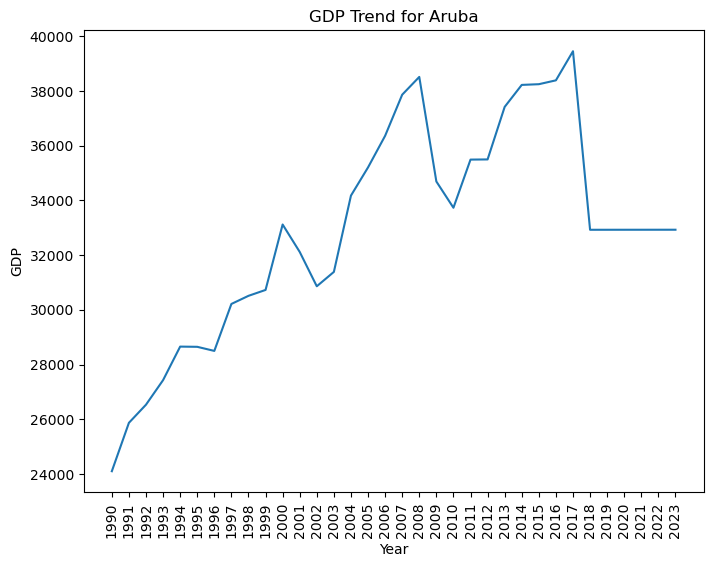

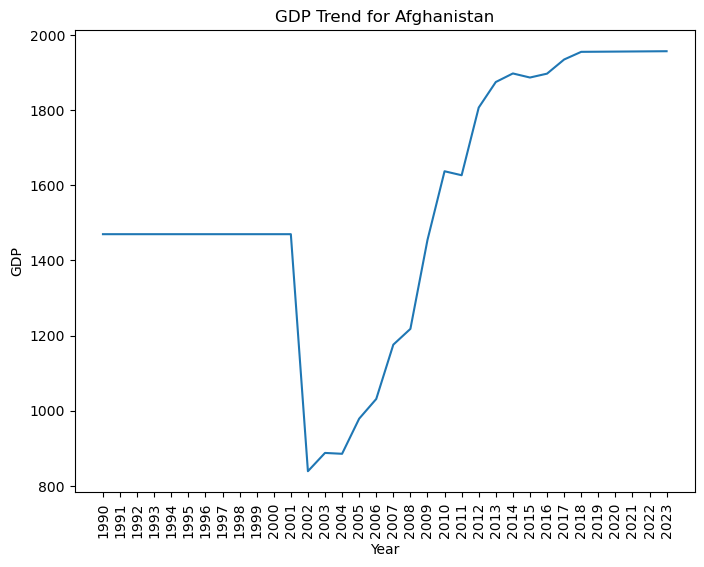

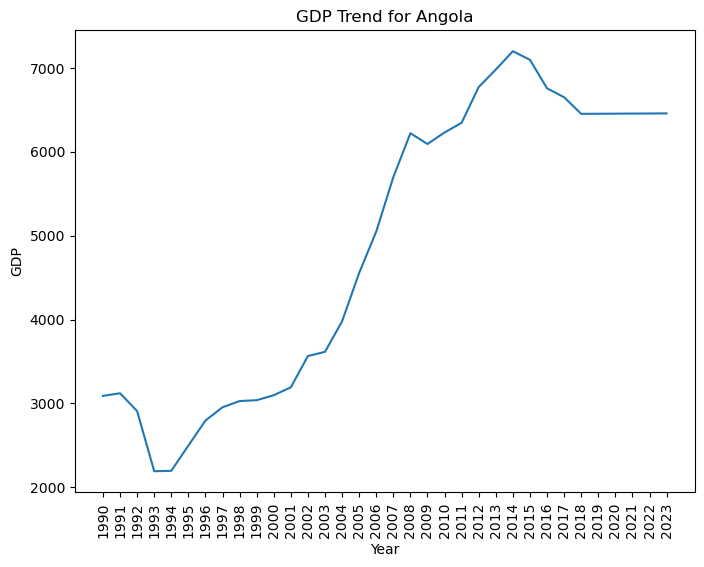

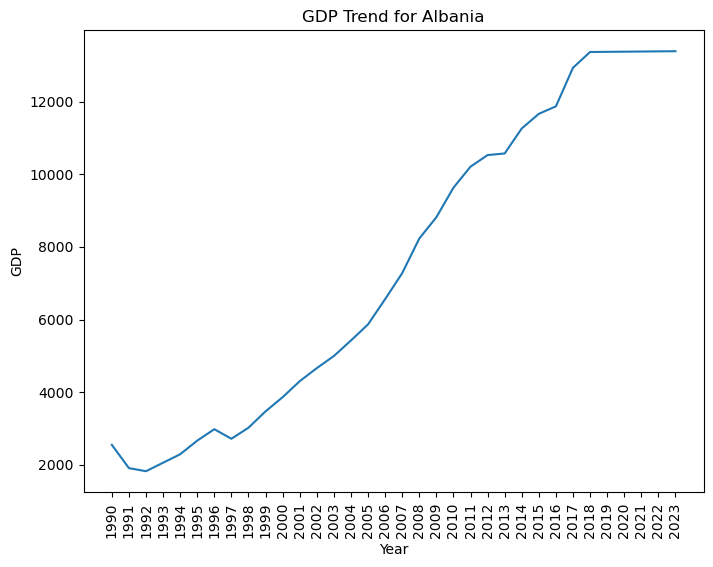

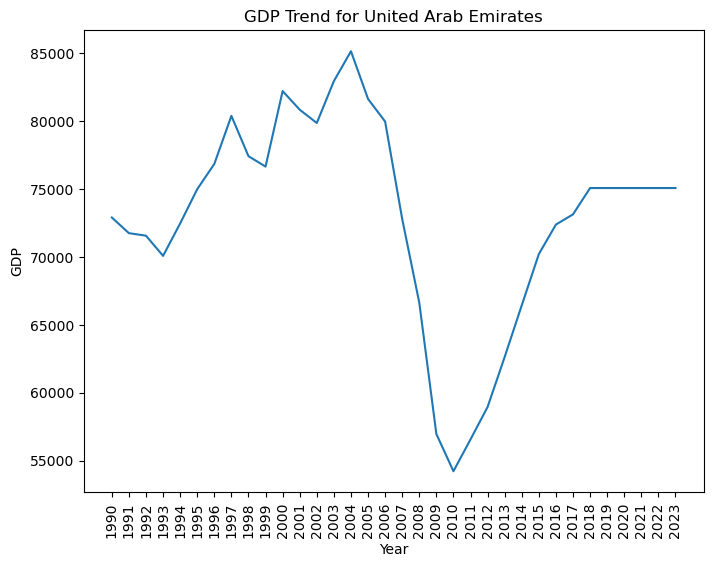

...

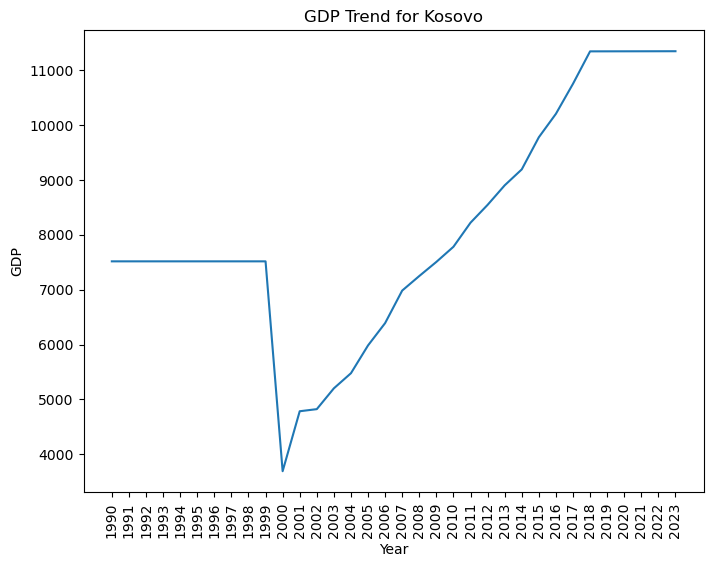

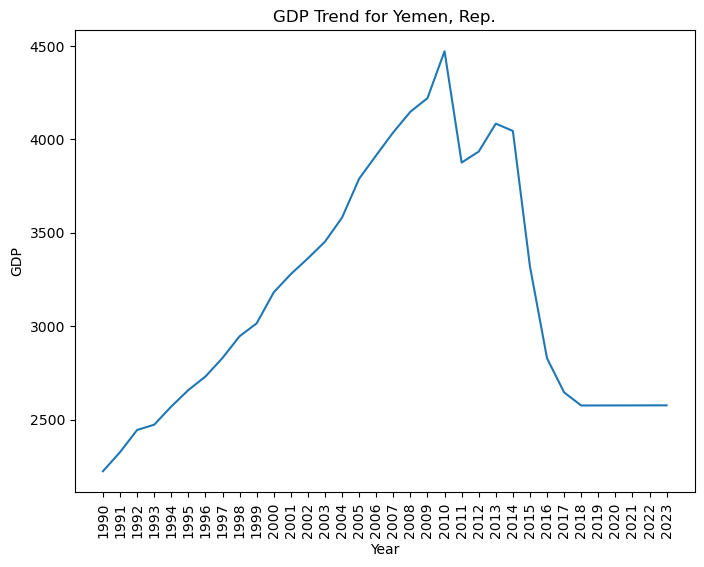

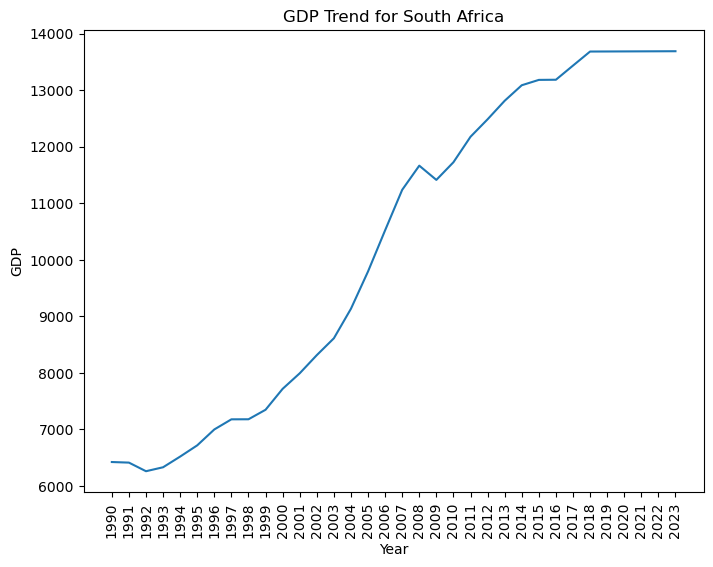

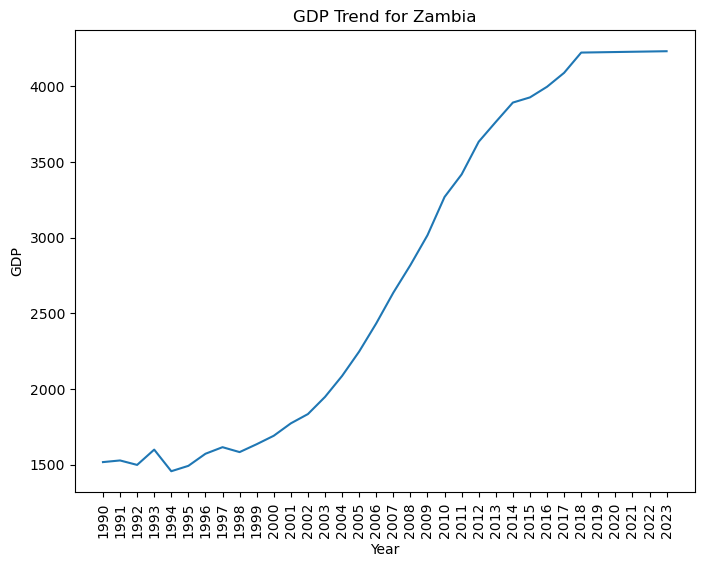

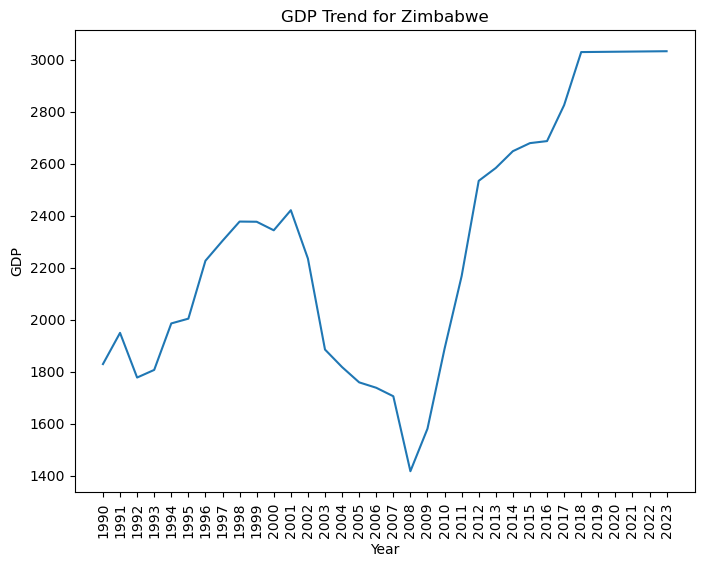

In [18]:
# Plotting the GDP trends for different countries
for index, row in gdp_ppp.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.figure(figsize=(8, 6))
    plt.plot(gdp_ppp.columns[1:], gdp_data)
    plt.title(f'GDP Trend for {country_name}')
    plt.xlabel('Year')
    plt.ylabel('GDP')
    plt.xticks(rotation='vertical')
    plt.show()

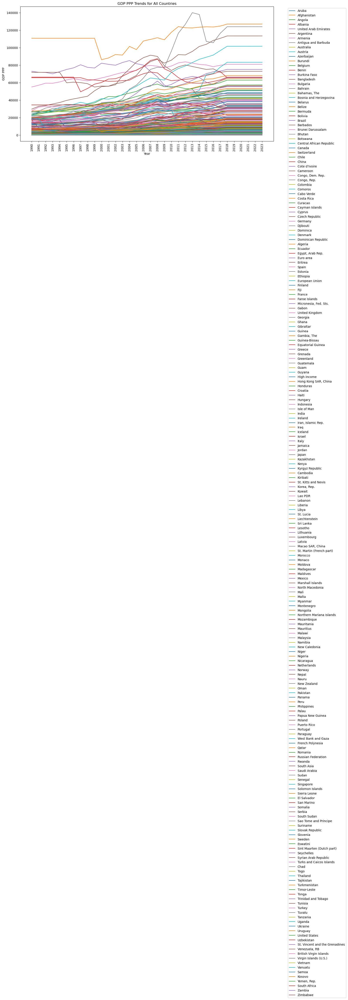

In [19]:
# Plotting GDP trends for all the countries
plt.figure(figsize=(15, 8)) 

for index, row in gdp_ppp.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.plot(gdp_ppp.columns[1:], gdp_data, label=country_name)

plt.title('GDP PPP Trends for All Countries')
plt.xlabel('Year')
plt.ylabel('GDP PPP')
plt.xticks(rotation='vertical')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.tight_layout()
plt.show()

In [20]:
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38223.372260,38249.054870,38390.271650,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1897.525938,1886.692977,1896.992520,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,7199.245478,7096.600615,6756.935074,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11259.225890,11662.030480,11868.178970,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,66443.997580,70212.093010,72386.090470,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20008.320640,20551.833190,20130.408030,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8405.073655,8727.385447,8808.572714,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,21599.199140,22422.029390,23670.302260,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,46880.220660,46276.150690,47305.880020,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,48799.715470,49879.266470,51809.513630,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584


In [21]:
#Extracting as an excel file 
gdp_ppp.to_excel('gdp_ppp_clean.xlsx', index=False)

In [22]:
#Creating a new column with the average of gdp fro the last 10 years
gdp_ppp['Avg_last_10_years'] = gdp_ppp[['2013','2014','2015','2016','2017','2018','2019','2020','2021', '2022', '2023']].mean(axis=1)
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Avg_last_10_years
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38249.054870,38390.271650,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092,35391.542191
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1886.692977,1896.992520,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180,1929.600431
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,7096.600615,6756.935074,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463,6674.022955
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11662.030480,11868.178970,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688,12594.470967
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,70212.093010,72386.090470,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148,72297.625355
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20551.833190,20130.408030,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562,20508.148835
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8727.385447,8808.572714,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898,9606.627555
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,22422.029390,23670.302260,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259,24929.259034
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,46276.150690,47305.880020,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246,49636.638363
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,49879.266470,51809.513630,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584,53191.230249


In [23]:
# Defining the X and the y axis
columns_to_drop = ['country', 'Avg_last_10_years']
X = gdp_ppp.drop(columns=columns_to_drop)
y = gdp_ppp['Avg_last_10_years']

In [24]:
# Spliting the x and y 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [25]:
#Testing the LR model
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
predictions_lr = model_lr.predict(X_test)

In [26]:
# Printing the predictions
predictions_lr

array([ 2.25896667e+04,  1.34414567e+04,  1.09691122e+04,  3.26506748e+03,
        3.97388565e+03, -1.81898940e-11,  1.02553002e+04,  2.59133139e+04,
        1.43434653e+04, -1.81898940e-11,  5.02378052e+03,  4.68126770e+04,
        3.18859576e+03,  5.31912302e+04,  1.11474039e+04,  2.46898169e+03,
        7.94378979e+03,  3.14281805e+04,  4.16119970e+03,  4.44118401e+04,
        2.37520816e+04,  5.37632940e+03,  8.15548035e+03,  1.80337984e+04,
        3.80599479e+04,  1.49897231e+04,  1.25381978e+05,  2.04119571e+04,
        3.71076576e+04,  1.96130185e+03,  1.30774575e+03,  1.87223575e+03,
        1.27136689e+04,  7.79678467e+03,  1.91827761e+04,  3.96422810e+04,
        1.44563682e+04,  2.21641563e+04, -1.81898940e-11,  2.66354711e+04,
        9.32121254e+03,  2.87877564e+04,  1.22747460e+05,  3.81512969e+04])

In [27]:
#Testing the RF model
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
predictions_rf = model_rf.predict(X_test)

In [28]:
# Printing the predictions
predictions_rf

array([ 23593.95992375,  13300.1991276 ,  11178.77511913,   3308.32648187,
         3938.32807688,      0.        ,  10320.63197026,  26456.08681368,
        14318.05544677,      0.        ,   5068.78169924,  47049.33132685,
         3202.11008961,  52900.85635398,  11003.55515529,   2609.01707988,
         8114.41113744,  32977.43950132,   4095.78276819,  44322.39115962,
        24483.70579844,   5487.88889922,   8085.1725076 ,  18042.41184859,
        37394.58220399,  14581.41504154, 100950.62278908,  19298.96460972,
        36526.81158112,   1929.65795763,   1390.80681276,   1962.45737808,
        12768.14941693,   7992.43130551,  18813.42378874,  39467.26334248,
        14575.05184864,  21825.93272328,      0.        ,  27291.46461389,
         9595.82305593,  28965.81696026, 100991.16972422,  37910.56946144])

In [29]:
#Testing the GB model
from sklearn.ensemble import GradientBoostingRegressor
model_gb = GradientBoostingRegressor()
model_gb.fit(X_train, y_train)
predictions_gb = model_gb.predict(X_test)

In [30]:
# Printing the predictions
predictions_gb

array([2.40393228e+04, 1.33984655e+04, 1.07369933e+04, 3.22991512e+03,
       3.80445855e+03, 1.09417529e+01, 1.01930108e+04, 2.55012326e+04,
       1.45344969e+04, 1.09417529e+01, 5.30799115e+03, 4.69720253e+04,
       3.12409294e+03, 5.38687833e+04, 1.14766711e+04, 2.63143933e+03,
       7.85844841e+03, 3.22298009e+04, 3.95576132e+03, 4.39892526e+04,
       2.43069522e+04, 5.88678739e+03, 8.25282717e+03, 1.79072844e+04,
       3.79050450e+04, 1.47787552e+04, 1.08688304e+05, 1.89746602e+04,
       3.79284140e+04, 1.92467264e+03, 1.34173498e+03, 1.95758174e+03,
       1.27966200e+04, 8.31012213e+03, 1.90889562e+04, 4.01318170e+04,
       1.42898266e+04, 2.11657196e+04, 1.09417529e+01, 2.67949474e+04,
       9.05729725e+03, 2.93271358e+04, 1.08515257e+05, 3.81011700e+04])

In [31]:
# Evaluation of the LR Model 
mae_lr = mean_absolute_error(y_test, predictions_lr)
mse_lr = mean_squared_error(y_test, predictions_lr)
r2_lr = r2_score(y_test, predictions_lr)

In [32]:
# Evaluation of the RF Model 
mae_rf = mean_absolute_error(y_test, predictions_rf)
mse_rf = mean_squared_error(y_test, predictions_rf)
r2_rf = r2_score(y_test, predictions_rf)

In [33]:
# Evaluation of the GB Model 
mae_gb = mean_absolute_error(y_test, predictions_gb)
mse_gb = mean_squared_error(y_test, predictions_gb)
r2_gb = r2_score(y_test, predictions_gb)

In [34]:
#  Printing the evaluations of the models 
rmse_lr = np.sqrt(mean_squared_error(y_test, predictions_lr))
rmse_rf = np.sqrt(mean_squared_error(y_test, predictions_rf))
rmse_gb = np.sqrt(mean_squared_error(y_test, predictions_gb))

print("Linear Regression Metrics:")
print("Mean Absolute Error:", mae_lr)
print("Mean Squared Error:", mse_lr)
print("Root Mean Squared Error:", rmse_lr)
print("R-squared:", r2_lr)

print("\nRandom Forest Metrics:")
print("Mean Absolute Error:", mae_rf)
print("Mean Squared Error:", mse_rf)
print("Root Mean Squared Error:", rmse_rf)
print("R-squared:", r2_rf)

print("\nGradient Boosting Metrics:")
print("Mean Absolute Error:", mae_gb)
print("Mean Squared Error:", mse_gb)
print("Root Mean Squared Error:", rmse_gb)
print("R-squared:", r2_gb)

Linear Regression Metrics:
Mean Absolute Error: 1.721838833129203e-11
Mean Squared Error: 1.0328947910271527e-21
Root Mean Squared Error: 3.213868060495254e-11
R-squared: 1.0

Random Forest Metrics:
Mean Absolute Error: 1306.6978371967125
Mean Squared Error: 24498031.94390958
Root Mean Squared Error: 4949.5486606265
R-squared: 0.9647937932584786

Gradient Boosting Metrics:
Mean Absolute Error: 1003.9176607900106
Mean Squared Error: 11148878.09900736
Root Mean Squared Error: 3338.993575766111
R-squared: 0.9839779085851321


In [35]:
#Defining the X and y axis to 2024
columns_to_drop = ['country', 'Avg_last_10_years']
X = gdp_ppp.drop(columns=columns_to_drop)
y = gdp_ppp['Avg_last_10_years']

In [36]:
#Applying the LR model to 2024
LR= LinearRegression()
LR.fit(X, y)
predictions_2024 = LR.predict(X)

In [37]:
#Printing the predictions of 2024
predictions_2024

array([ 3.53915422e+04,  1.92960043e+03,  6.67402295e+03,  1.25944710e+04,
        7.22976254e+04,  2.05081488e+04,  9.60662755e+03,  2.49292590e+04,
        4.96366384e+04,  5.31912302e+04,  1.78398016e+04,  7.55803714e+02,
        4.92149770e+04,  2.29648021e+03,  1.87138112e+03,  3.97388565e+03,
        2.04119571e+04,  4.69298456e+04,  3.14281805e+04,  1.35253796e+04,
        1.93329010e+04,  8.45207040e+03,  4.33544967e+04,  7.41891843e+03,
        1.59888060e+04,  1.80337984e+04,  8.06068016e+04,  9.53383484e+03,
        1.79051590e+04,  8.11101298e+02,  4.68126770e+04,  6.59142786e+04,
        2.42219098e+04,  1.65672985e+04,  3.86092224e+03,  3.62037389e+03,
        8.92359573e+02,  5.74595215e+03,  1.44900015e+04,  2.81666096e+03,
        7.05380874e+03,  1.67675640e+04,  2.77972440e+04,  6.68576822e+04,
        3.58639131e+04,  3.71076576e+04,  5.08848819e+04,  2.74426865e+03,
        1.09998600e+04,  5.29913305e+04,  1.62957192e+04,  1.50923045e+04,
        1.15541234e+04,  

In [38]:
# Converting the values from exponencial to normal numbers
pred_2024 = np.round(predictions_2024, decimals=1)
gdp_ppp['2024'] = pred_2024

In [39]:
# Printing the dataset
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2016,2017,2018,2019,2020,2021,2022,2023,Avg_last_10_years,2024
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38390.271650,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092,35391.542191,35391.5
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1896.992520,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180,1929.600431,1929.6
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6756.935074,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463,6674.022955,6674.0
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11868.178970,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688,12594.470967,12594.5
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,72386.090470,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148,72297.625355,72297.6
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20130.408030,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562,20508.148835,20508.1
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8808.572714,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898,9606.627555,9606.6
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,23670.302260,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259,24929.259034,24929.3
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,47305.880020,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246,49636.638363,49636.6
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,51809.513630,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584,53191.230249,53191.2


In [40]:
#Defining the X and y axis to 2025
columns_to_drop = ['country', 'Avg_last_10_years','2024']
X = gdp_ppp.drop(columns=columns_to_drop)
y = gdp_ppp['2024']

In [41]:
#Applying the model LR to 2025
LR= LinearRegression()
LR.fit(X, y)
predictions_2025 = LR.predict(X)

In [42]:
#Printing the predictions of 2025 
predictions_2025

array([3.53915340e+04, 1.92960305e+03, 6.67401886e+03, 1.25944707e+04,
       7.22976041e+04, 2.05081599e+04, 9.60663151e+03, 2.49292912e+04,
       4.96366394e+04, 5.31912359e+04, 1.78398123e+04, 7.55805620e+02,
       4.92149802e+04, 2.29648077e+03, 1.87138979e+03, 3.97388764e+03,
       2.04119722e+04, 4.69298567e+04, 3.14281863e+04, 1.35253759e+04,
       1.93329102e+04, 8.45207777e+03, 4.33544849e+04, 7.41892062e+03,
       1.59888108e+04, 1.80338042e+04, 8.06067980e+04, 9.53382980e+03,
       1.79051739e+04, 8.11104572e+02, 4.68126868e+04, 6.59142807e+04,
       2.42219297e+04, 1.65672878e+04, 3.86092328e+03, 3.62037365e+03,
       8.92360416e+02, 5.74594983e+03, 1.44900081e+04, 2.81666199e+03,
       7.05380542e+03, 1.67675801e+04, 2.77972445e+04, 6.68576756e+04,
       3.58639210e+04, 3.71076500e+04, 5.08848815e+04, 2.74427020e+03,
       1.09998671e+04, 5.29913202e+04, 1.62957337e+04, 1.50923070e+04,
       1.15541242e+04, 1.17658611e+04, 4.40960409e+04, 1.87223341e+03,
      

In [43]:
#Converting the predictions from exponencial to normal numbers
pred_2025 = np.round(predictions_2025, decimals=1)
gdp_ppp['2025'] = pred_2025

In [44]:
#Printing the dataset 
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2017,2018,2019,2020,2021,2022,2023,Avg_last_10_years,2024,2025
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092,35391.542191,35391.5,35391.5
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180,1929.600431,1929.6,1929.6
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463,6674.022955,6674.0,6674.0
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688,12594.470967,12594.5,12594.5
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148,72297.625355,72297.6,72297.6
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562,20508.148835,20508.1,20508.2
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898,9606.627555,9606.6,9606.6
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259,24929.259034,24929.3,24929.3
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246,49636.638363,49636.6,49636.6
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584,53191.230249,53191.2,53191.2


In [45]:
#DRoppig the column ' avg last 10 years'
gdp_ppp.drop('Avg_last_10_years', axis=1, inplace=True)
gdp_ppp

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Aruba,24101.109430,25870.755940,26533.343900,27430.752400,28656.520210,28648.990020,28499.089430,30215.949230,30512.683910,...,38390.271650,39454.629830,32927.374849,32927.741068,32928.107301,32928.473550,32928.839813,32929.206092,35391.5,35391.5
1,Afghanistan,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,1469.990089,...,1896.992520,1934.636754,1955.006208,1955.336153,1955.666323,1955.996717,1956.327336,1956.658180,1929.6,1929.6
2,Angola,3089.683369,3120.356148,2908.160798,2190.768160,2195.532289,2496.199493,2794.896906,2953.342709,3027.341795,...,6756.935074,6650.584940,6452.355165,6453.443520,6454.532227,6455.621286,6456.710698,6457.800463,6674.0,6674.0
3,Albania,2549.473022,1909.114038,1823.307673,2057.449657,2289.873135,2665.764906,2980.066288,2717.362124,3021.014738,...,11868.178970,12930.140030,13364.155400,13368.397329,13372.640921,13376.886178,13381.133100,13385.381688,12594.5,12594.5
4,United Arab Emirates,72906.520120,71753.729560,71567.827520,70082.389330,72471.687290,74994.380620,76848.792240,80390.064110,77421.108660,...,72386.090470,73137.870190,75075.257410,75075.287157,75075.316904,75075.346652,75075.376400,75075.406148,72297.6,72297.6
5,Argentina,7380.115031,8210.643432,8942.569853,9777.214005,10435.910770,10225.118710,10857.429670,11802.842590,12255.676260,...,20130.408030,20843.155070,20610.568550,20612.361266,20614.154226,20615.947428,20617.740873,20619.534562,20508.1,20508.2
6,Armenia,2428.558960,2237.752728,1356.210786,1296.178498,1429.102386,1591.894846,1742.734114,1852.200102,2025.555420,...,8808.572714,9620.818491,10343.175590,10346.434567,10349.694885,10352.956546,10356.219550,10359.483898,9606.6,9606.6
7,Antigua and Barbuda,11326.702620,11806.234410,12005.986790,12682.475350,13524.670290,12924.355370,13729.757550,14416.114870,14951.180660,...,23670.302260,24644.551880,26868.133520,26869.505625,26870.877852,26872.250200,26873.622669,26874.995259,24929.3,24929.3
8,Australia,17329.706610,17790.980140,18189.378740,19131.841870,20064.459010,20894.397210,21972.052650,22934.786010,24196.721280,...,47305.880020,49628.811810,51663.365090,51665.346293,51667.327609,51669.309041,51671.290586,51673.272246,49636.6,49636.6
9,Austria,19442.312040,20585.019310,21259.636750,21698.307670,22606.829640,23660.408610,24529.207830,25424.069930,26674.609550,...,51809.513630,53937.066380,55454.689290,55456.541558,55458.393922,55460.246381,55462.098935,55463.951584,53191.2,53191.2


In [46]:
#Extracting the dataset to excel 
gdp_ppp.to_excel('gdp_ppp_pred_24_25.xlsx', index=False)

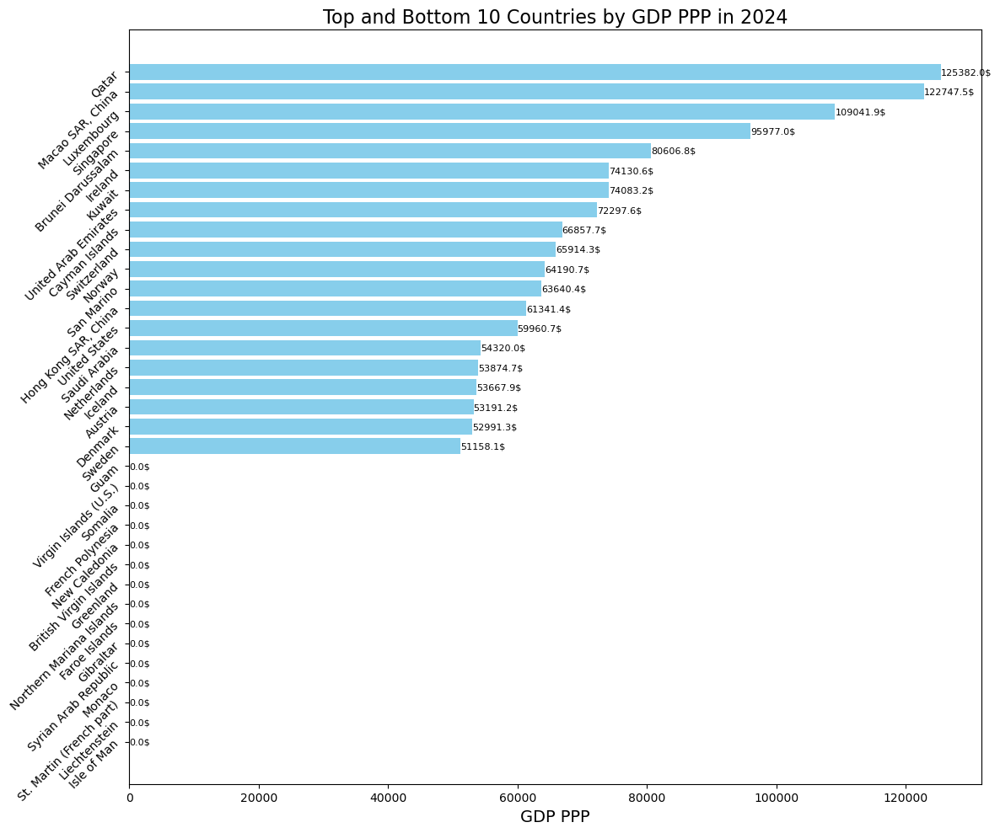

In [47]:
#Plotting the top 10 and bottom of 2024
gdp_ppp.sort_values(by="2024", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_ppp.head(20), gdp_ppp.tail(15)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2024'], color='skyblue')


plt.xlabel('GDP PPP', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP PPP in 2024', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}$'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout()  
plt.show()

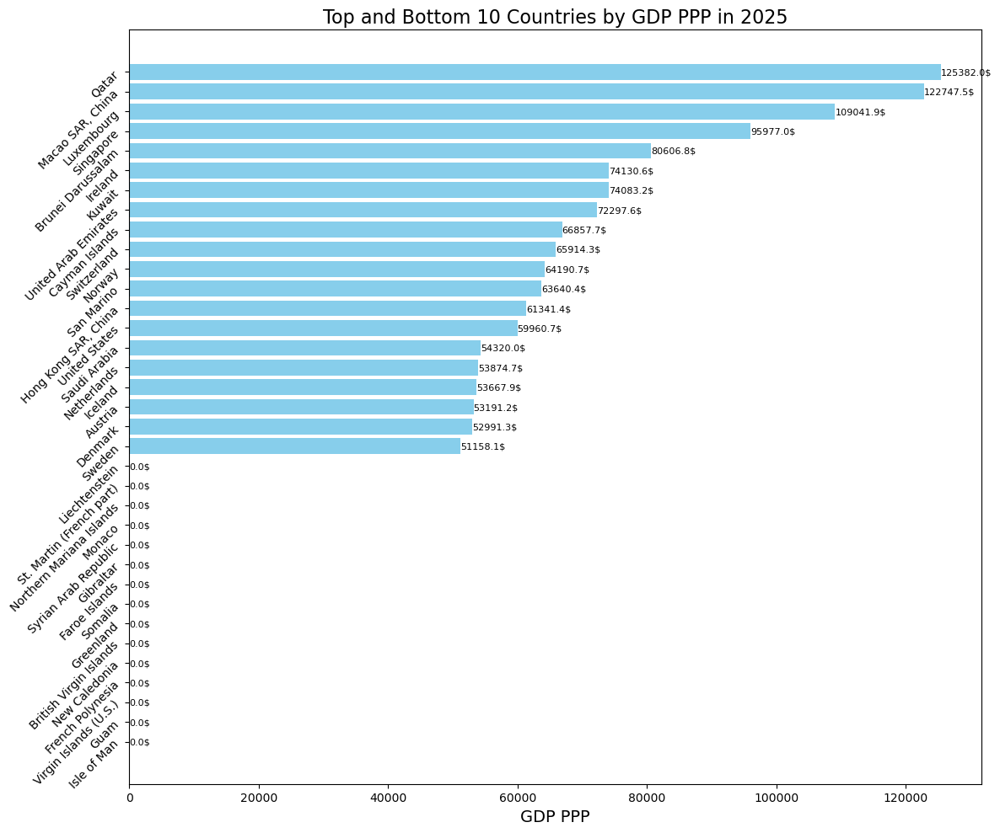

In [48]:
#Plotting the top 10 and bottom of 2025
gdp_ppp.sort_values(by="2025", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_ppp.head(20), gdp_ppp.tail(15)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2025'], color='skyblue')


plt.xlabel('GDP PPP', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP PPP in 2025', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}$'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout()
plt.savefig('GDP_PPP_2025.png')
plt.show()

In [49]:
#Changing the format of the table, creating a new column with all the years 
gdp_ppp_pivot = pd.melt(gdp_ppp, id_vars=['country'], var_name='year', value_name='gdp')
gdp_ppp_pivot = gdp_ppp_pivot.sort_values(by='country')
gdp_ppp_pivot

,country,year,gdp
1697,Afghanistan,1997,1469.990089
4937,Afghanistan,2012,1806.763930
1265,Afghanistan,1995,1469.990089
4073,Afghanistan,2008,1218.118215
6881,Afghanistan,2021,1955.996717
617,Afghanistan,1992,1469.990089
4721,Afghanistan,2011,1626.764793
3641,Afghanistan,2006,1031.643135
1481,Afghanistan,1996,1469.990089
2345,Afghanistan,2000,1469.990089


In [50]:
# Sorting the values of the dataset by country and after by year
gdp_ppp_pivot = gdp_ppp_pivot.sort_values(by=['country','year'])
gdp_ppp_pivot

,country,year,gdp
185,Afghanistan,1990,1469.990089
401,Afghanistan,1991,1469.990089
617,Afghanistan,1992,1469.990089
833,Afghanistan,1993,1469.990089
1049,Afghanistan,1994,1469.990089
1265,Afghanistan,1995,1469.990089
1481,Afghanistan,1996,1469.990089
1697,Afghanistan,1997,1469.990089
1913,Afghanistan,1998,1469.990089
2129,Afghanistan,1999,1469.990089


In [51]:
#Extracting the dataset to excel file 
gdp_ppp_pivot.to_excel('gdp_ppp_pivot.xlsx', index=False)